##**Reconstructing Images using Deep Generative Models**

### [UTZappos50K](http://vision.cs.utexas.edu/projects/finegrained/utzap50k/) is used in this project. 

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
#IMPORTS
import os
import torch
import torch.utils.data
from torch import nn, optim
from torch.autograd import Variable
from torch.nn import functional as F
import torchvision
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
import numpy as np
import time
from torch.utils.tensorboard import SummaryWriter
import torch
import glob
from PIL import Image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
#splits the data into train,val and test and builds their corresponding dataloader
import torchvision
h = 128
w = 128
image_transform = transforms.Compose([transforms.Resize((h,w)),transforms.ToTensor()])
images = torchvision.datasets.ImageFolder('/content/DATASETS/UTZappos50K',transform = image_transform)
train_set, test_set, val_set = torch.utils.data.random_split(images, [35000,10000,5025])
train_loader = DataLoader(train_set,batch_size=16,shuffle=True,num_workers=2)
val_loader = DataLoader(val_set,batch_size=16,shuffle=True,num_workers=2)
test_loader=DataLoader(test_set,batch_size=16,shuffle=True,num_workers=2)

## Convolutional AutoEncoder (CAE):

In [ ]:
Vali_Loss_DIR = "Avg_Validation_Loss"
vali_loss = SummaryWriter(os.path.join(ROOT_LOG_DIR, Vali_Loss_DIR))

In [ ]:
class CAE(torch.nn.Module):
    def __init__(self):
      super(CAE, self).__init__()
      self.conv1 = nn.Conv2d(3,16,padding=1,kernel_size=3,stride=1)
      self.bn1 = nn.BatchNorm2d(16)
      self.conv2 = nn.Conv2d(16,32,padding=1,kernel_size=3,stride=1)
      self.pool = nn.MaxPool2d(2, 2)
      self.bn2 = nn.BatchNorm2d(32)
      self.conv3 = nn.Conv2d(32,64,padding=1,kernel_size=3,stride=1)
      self.bn3 = nn.BatchNorm2d(64)
      self.convt1 = nn.ConvTranspose2d(64,32,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.convt2 = nn.ConvTranspose2d(32,16,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.convt3 = nn.ConvTranspose2d(16,3,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.linear1 = nn.Linear(64*16*16,2048)
      self.linear2 = nn.Linear(2048,64*16*16)
      self.latent = nn.Linear(2048,2048)

    def forward(self, x):
      x = self.pool(F.relu(self.bn1(self.conv1(x))))
      x = self.pool(F.relu(self.bn2(self.conv2(x))))
      x = self.pool(F.relu(self.bn3(self.conv3(x)))). view(-1,64*16*16)
      x = self.linear1(x)
      x = self.latent(x)
      x = self.linear2(x)
      x = F.relu(self.bn2(self.convt1(x.view(-1,64,16,16))))
      x = F.relu(self.bn1(self.convt2(x)))
      x = self.convt3(x)

      return x

In [ ]:
# optimizers, loss functions
import torch.optim as optim
CAE_net = CAE()
CAE_net.to(device)
CAE_optimizer = optim.Adam(CAE_net.parameters(),lr=0.0001)
CAE_criterion = nn.MSELoss()
plot = SummaryWriter()

In [ ]:
#training loop
epoch = 30
for epoch in range(11,epoch):
  running_loss = 0.0
  true_pred = torch.tensor([0.0])
  iters = 0
  for idx, (inputs,labels) in enumerate(train_loader):
    CAE_optimizer.zero_grad()
    outputs = CAE_net(inputs.to(device))
    CAE_loss = CAE_criterion(outputs.float().to(device),inputs.float().to(device))
    CAE_loss.backward()
    CAE_optimizer.step()
    running_loss += CAE_loss.item()
    iters += 1
    if iters%200 == 0 and iters!= 0 :
      print('epochs:', epoch,'loss:',running_loss/iters )
  reco_loss = running_loss/iters
  print('Epoch:', epoch, reco_loss)
  vali_loss.add_scalar('Avg Validation Loss', reco_loss, iters+1)

epochs: 11 loss: 0.49877291709184646
epochs: 11 loss: 0.3546892485767603
epochs: 11 loss: 0.26920695578679443
epochs: 11 loss: 0.21571271263062955
epochs: 11 loss: 0.17958994910866022
epochs: 11 loss: 0.15382579512428493
epochs: 11 loss: 0.13468458172333028
epochs: 11 loss: 0.11995804439298809
epochs: 11 loss: 0.10824917336822384
epochs: 11 loss: 0.09878495025075971
Epoch: 11 0.09136661123509912


In [ ]:
#LOAD FROM DRIVE
cae_model_location = '/content/drive//My Drive/Colab Notebooks/HW3/CAE.pt'
CAE_net = CAE()
CAE_net.to(device)
CAE_net.load_state_dict(torch.load(cae_model_location))

<All keys matched successfully>

tensor([0.])


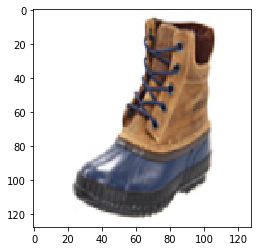

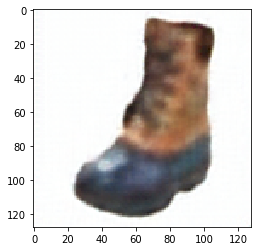

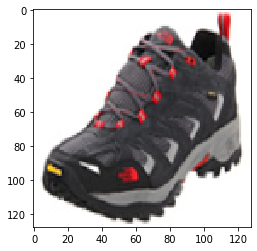

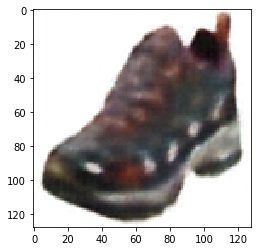

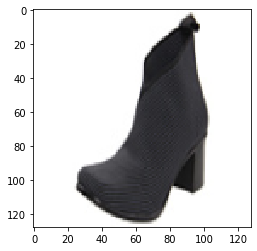

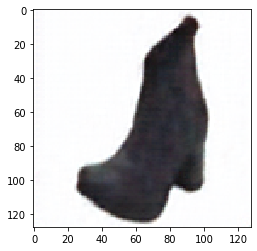

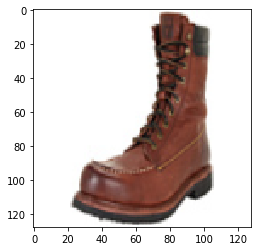

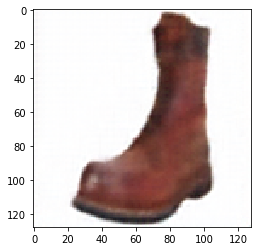

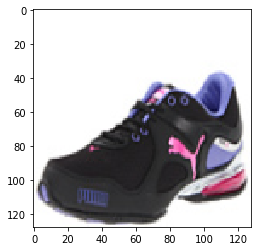

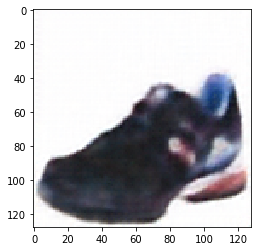

In [ ]:
#validation loop
with torch.no_grad():
  running_loss = 0
  accuracy = torch.tensor([0.0])
  iters = 0
  for idx,data in enumerate(test_loader):
    img_inputs, img_labels = data
    img_inputs = img_inputs.to(device)
    img_labels = img_labels.to(device)
    outputs = CAE_net(img_inputs)
    outputs = outputs.cpu()
    img_inputs = img_inputs.cpu()
    if iters < 5:
      fig,axs = plt.subplots()
      axs.imshow(img_inputs[0].numpy().transpose((1,2,0)))
      fig,axs = plt.subplots()
      axs.imshow(outputs[0].numpy().transpose((1,2,0)))
    iters = iters+1
print(accuracy/(iters+1)) 

##Variational AutoEncoder (VAE): 

The loss function used to train the VAE is:

$$ L_{reconstruciton} = -\frac{1}{n} \sum_{i}^{n}(x_i log(f(z_i)) + (1-x_i) log(1-f(z_i))) $$
$$ L_{regularization} = \frac{1}{2n}\sum_{i}^{n}(\mu_{i}^{2} + \sigma_{i}^2 - log(\sigma_i^2)- 1)$$
$$ L_{loss} =L_{regularization} +  L_{reconstruction}$$






In [ ]:
Recon_Loss_DIR = "Reconstruction_Loss"
reco_loss = SummaryWriter(os.path.join(ROOT_LOG_DIR, Recon_Loss_DIR))

In [ ]:
class VAE(torch.nn.Module):
    def __init__(self):
      super(VAE, self).__init__()
      self.conv1 = nn.Conv2d(3,16,padding=1,kernel_size=4,stride=2)
      self.conv2 = nn.Conv2d(16,32,padding=1,kernel_size=4,stride=2)
      self.conv3 = nn.Conv2d(32,64,padding=1,kernel_size=4,stride=2)
      self.conv4 = nn.Conv2d(64,128,padding=1,kernel_size=4,stride=2)
      self.convt1 = nn.ConvTranspose2d(128,64,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.convt2 = nn.ConvTranspose2d(64,32,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.convt3 = nn.ConvTranspose2d(32,16,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.convt4 = nn.ConvTranspose2d(16,3,kernel_size=3,stride=2,padding = 1,output_padding=1)
      self.linear = nn.Linear(8192,2048)
      self.linear1 = nn.Linear(2048,2048)
      self.linear2 = nn.Linear(2048,2048)
      self.linear3 = nn.Linear(2048,8192)

    def encode(self,x):
      x = self.conv1(x)
      x = (F.relu(x))
      x = self.conv2(x)
      x = F.relu(x)
      x = self.conv3(x)
      x = F.relu(x)
      x = F.relu(self.conv4(x)).view(-1,128*8*8)
      latent = F.relu(self.linear(x))
      mu = self.linear1(latent)
      logvar = self.linear2(latent)
      return mu,logvar,latent

    def reparametrize(self,mu,logvar):
      if self.training:
        std = logvar.mul(0.5).exp_()
        eps = std.data.new(std.size()).normal_()
        z = eps.mul(std).add_(mu)
      else:
        z = mu   
      return z
    def decode(self,z):
      z = F.relu(self.linear3(z))
      z = F.relu(self.convt1(z.view(-1,128,8,8)))
      z = F.relu(self.convt2(z))
      z = F.relu(self.convt3(z))
      z = self.convt4(z)
      z = torch.sigmoid(z)
      return z
    def forward(self,x):
      mu,logvar,latent = self.encode(x)
      z = self.reparametrize(mu,logvar)
      recon_batch = self.decode(z)
      return mu, logvar, recon_batch, z               

model = VAE()
model = model.to(device)

In [ ]:
import torch.optim as optim
from torchvision.utils import save_image
plot = SummaryWriter()

In [ ]:
def loss_function(recon_x, x, mu, logvar) :
    BCE = F.binary_cross_entropy(recon_x, x)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    KLD /= 128*8*8*16
    return BCE + KLD
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
def train(epoch):
    model.train()
    train_loss = 0
    for batch_idx, (data, _) in enumerate(train_loader):

        data = data.cuda()
        optimizer.zero_grad()
        mu, logvar, recon_batch,latent = model(data)
        loss = loss_function(recon_batch, data, mu, logvar)

        loss.backward()
        train_loss += loss.item()

        optimizer.step()
        if batch_idx % 10 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                loss.item() / len(data)))

    print('====> Epoch: {} Average loss: {:.4f}'.format(
          epoch, train_loss / len(train_loader.dataset)))
    if epoch%5 == 0 :
      torch.save(model.state_dict(), 'saved_model_state.pt')
    reco_loss.add_scalar('Recon_Losss', train_loss/len(train_loader.dataset), epoch)


def test(epoch):
    model.eval()
    test_loss = 0

    for i, (data, _) in enumerate(test_loader):
        data = data.cuda()

        mu, logvar, recon_batch,latent = model(data)
        test_loss += loss_function(recon_batch, data, mu, logvar).item()
        if i == 0:
          n = min(data.size(0), 8)
          comparison = torch.cat([data[:n],
                                  recon_batch.view(16, 3, 128, 128)[:n]])

    test_loss /= len(test_loader.dataset)
    print('====> Test set loss: {:.4f}'.format(test_loss))

In [ ]:
EPOCHS = 50
for epoch in range(1, EPOCHS + 1):
    train(epoch)
    test(epoch)

Train Epoch: 1 [0/35000 (0%)]	Loss: 0.042534
Train Epoch: 1 [160/35000 (0%)]	Loss: 0.042501
Train Epoch: 1 [320/35000 (1%)]	Loss: 0.042256
Train Epoch: 1 [480/35000 (1%)]	Loss: 0.042166
Train Epoch: 1 [640/35000 (2%)]	Loss: 0.042402
Train Epoch: 1 [800/35000 (2%)]	Loss: 0.041791
Train Epoch: 1 [960/35000 (3%)]	Loss: 0.040717
Train Epoch: 1 [1120/35000 (3%)]	Loss: 0.040462
Train Epoch: 1 [1280/35000 (4%)]	Loss: 0.037734
Train Epoch: 1 [1440/35000 (4%)]	Loss: 0.036930
Train Epoch: 1 [1600/35000 (5%)]	Loss: 0.035812
Train Epoch: 1 [1760/35000 (5%)]	Loss: 0.034553
Train Epoch: 1 [1920/35000 (5%)]	Loss: 0.033525
Train Epoch: 1 [2080/35000 (6%)]	Loss: 0.031370
Train Epoch: 1 [2240/35000 (6%)]	Loss: 0.030593
Train Epoch: 1 [2400/35000 (7%)]	Loss: 0.030427
Train Epoch: 1 [2560/35000 (7%)]	Loss: 0.027251
Train Epoch: 1 [2720/35000 (8%)]	Loss: 0.026036
Train Epoch: 1 [2880/35000 (8%)]	Loss: 0.024271
Train Epoch: 1 [3040/35000 (9%)]	Loss: 0.022585
Train Epoch: 1 [3200/35000 (9%)]	Loss: 0.022559
T

In [ ]:
#LOAD FROM DRIVE
vae_model_location = '/content/drive//My Drive/Colab Notebooks/VAE.pt'
VAE_net = VAE()
VAE_net.to(device)
VAE_net.load_state_dict(torch.load(vae_model_location))

<All keys matched successfully>

## Generate new Images using the Latent Space

In [ ]:
mu1,logvar1,_ = model.encode(image1.to(device))
mu2,logvar2,_ = model.encode(image2.to(device))
latent1 = model.reparametrize(mu1,logvar1)
latent2 = model.reparametrize(mu2,logvar2)

In [ ]:
for i in range(11):
  ratio = i/10
  z = latent1*ratio + latent2*(1-ratio)
  image = model.decode(z)
  image = image.cpu().detach()
  fig,axs = plt.subplots()
  axs.imshow(image[0].numpy().transpose((1,2,0)))

In [ ]:
#save images to drive
for i in range(101):
  ratio = i/100
  z = latent1*ratio + latent2*(1-ratio)
  image = model.decode(z)
  image = image.cpu().detach()
  save_image(image[0].data,
                     '/content/drive/My Drive/Deep_Regeneration/ratio_' + str(ratio) + '.png')

## Generative Models: Generative Adversarial Networks (GAN's)

In [ ]:
%tensorboard --logdir="/content/drive//My Drive/Colab Notebooks/GANs/Logs"

In [ ]:
h=64
w=64
image_transform = transforms.Compose([transforms.Resize((h,w)),transforms.ToTensor()])
images = torchvision.datasets.ImageFolder('/content/DATASETS/UTZappos50K/',transform = image_transform)

In [ ]:
#Z-VECTOR
def z_vector(batch_size= 64, feature_length= 100):
  mu, sigma = 0, 1
  z= np.random.normal(mu, sigma, (batch_size, feature_length))
  z= z.reshape((batch_size, feature_length, 1, 1))
  z= torch.tensor(z).float().to(device)
  return z

z= z_vector(10, 100).to(device)
print(z.shape)

torch.Size([10, 100, 1, 1])


In [ ]:
#GENERATOR NETWORK ARCHITECTURE
class Generator(nn.Module):
  def __init__(self, in_size):
    super(Generator, self).__init__()
    self.deconv1 = nn.ConvTranspose2d(in_size, 512, 4, 1, 0) #Output Size 512x1x1
    self.deconv2 = nn.ConvTranspose2d(512, 256, 4, 2, 1) #Output Size 256x2x2
    self.deconv3 = nn.ConvTranspose2d(256, 128, 4, 2, 1) #Output Size 128x4x4
    self.deconv4 = nn.ConvTranspose2d(128, 64, 4, 2, 1) #Output Size 64x16x16
    self.deconv5 = nn.ConvTranspose2d(64, 3, 4, 2, 1) #Output Size 3x64x64
    self.bn1 = nn.BatchNorm2d(512)
    self.bn2 = nn.BatchNorm2d(256)
    self.bn3 = nn.BatchNorm2d(128)
    self.bn4 = nn.BatchNorm2d(64)
    self.relu = nn.LeakyReLU(0.2)
    self.tanh = nn.Tanh()

  def forward(self, x):
    x = self.relu(self.bn1(self.deconv1(x)))
    x = self.relu(self.bn2(self.deconv2(x)))
    x = self.relu(self.bn3(self.deconv3(x)))
    x = self.relu(self.bn4(self.deconv4(x)))
    x = self.deconv5(x)
    out = self.tanh(x)
    return out

In [ ]:
#DISCRIMINATOR NETWORK ARCHITECTURE
class Discriminator(nn.Module):
  def __init__(self, in_size):
    super(Discriminator, self).__init__()
    self.conv1 = nn.Conv2d(in_size, 64, 4, 2, 1)
    self.conv2 = nn.Conv2d(64, 128, 4, 2, 1)
    self.conv3 = nn.Conv2d(128, 256, 4, 2, 1)
    self.conv4 = nn.Conv2d(256, 512, 4, 2, 1)
    self.conv5 = nn.Conv2d(512, 1, 4, 1, 0)
    self.bn1 = nn.BatchNorm2d(64)
    self.bn2 = nn.BatchNorm2d(128)
    self.bn3 = nn.BatchNorm2d(256)
    self.bn4 = nn.BatchNorm2d(512)
    self.relu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x = self.relu(self.bn1(self.conv1(x)))
    x = self.relu(self.bn2(self.conv2(x)))
    x = self.relu(self.bn3(self.conv3(x)))
    x = self.relu(self.bn4(self.conv4(x)))
    x = self.conv5(x)
    out = self.sigmoid(x)
    return out.view(-1)

Loss function for the generator:
$$ L_G = \frac{1}{n}\sum_{i=1}^{n}L_{CE}(D(G(z)), 1)$$


In [ ]:
#GENERATOR LOSS
#pass in the instance of BCELoss as mentioned in the instructions
def GeneratorLoss(G, D, z, loss):
  n = z.shape[0]
  image = G(z)
  predicted = D(image)
  ideal = torch.ones(n).to(device);
  genLoss = loss(predicted, ideal)
  return genLoss

Loss function for the discriminator:

$$ L_D = \frac{1}{2n}\sum_{i=1}^{n}L_{CE}(D(X_i), 1) + L_{CE}(D(G(z)), 0)$$


In [ ]:
#DISCRIMINATOR LOSS
#pass in the instance of BCELoss as mentioned in the instructions
def DiscriminatorLoss(G, D, Z, X, loss):
  n = X.shape[0]
  image = G(Z).detach()
  predictedG = D(image).view(-1)
  idealG = torch.zeros(n).to(device);
  predictedR = D(X)
  predictedR = predictedR.view(-1)
  idealR = torch.ones(n).to(device);
  fakeLoss = loss(predictedG, idealG)
  realLoss = loss(predictedR, idealR)
  totalLoss = (fakeLoss + realLoss)/(2)
  return fakeLoss, realLoss, totalLoss

In [ ]:
#GENERATOR, DISCRIMINATOR, OPTIMIZERS
batch_size = 32
n_channel = 3
n_features = 100
trainLoader = DataLoader(images,batch_size=batch_size,shuffle=True,num_workers=2)
generator = Generator(n_features).to(device)
discriminator = Discriminator(n_channel).to(device)
D_optimizer = optim.Adam(discriminator.parameters(),0.0001, betas=(0.5, 0.999))
G_optimizer = optim.Adam(generator.parameters(),0.0001, betas=(0.5, 0.999))

In [ ]:
#VISUALIZER FUNCTION
def generate_images(imgs, rows, cols, name= "gan", show= True):
  '''
  Displays the images in a rows * cols grid
  '''
  imgs= imgs[:rows*cols].cpu().detach().numpy()
  fig, ax= plt.subplots(rows, cols, figsize = (8,4))
  count= 0
  imgs = np.clip(imgs, a_min = 0, a_max = 255) 

  for row in range(rows):
    for col in range(cols):
      img= imgs[count]
      ax[row, col].imshow(np.transpose(img, (1, 2, 0)))
      ax[row, col].axis('off')
      count += 1
  fig.suptitle(name)
  fig.savefig("/content/drive//My Drive/Colab Notebooks/GANs/Images/%s.png"%(name))
  if(show): 
    plt.show()
  else: 
    plt.close()

step= 1024 , Generator loss=  tensor(5.8542, device='cuda:0') , Discriminator loss= tensor(0.0576, device='cuda:0')  (real= tensor(0.0469, device='cuda:0') ,fake= tensor(0.0683, device='cuda:0') )
step= 2048 , Generator loss=  tensor(5.8173, device='cuda:0') , Discriminator loss= tensor(0.0207, device='cuda:0')  (real= tensor(0.0134, device='cuda:0') ,fake= tensor(0.0279, device='cuda:0') )
step= 3072 , Generator loss=  tensor(6.1599, device='cuda:0') , Discriminator loss= tensor(0.0076, device='cuda:0')  (real= tensor(0.0024, device='cuda:0') ,fake= tensor(0.0127, device='cuda:0') )
step= 4096 , Generator loss=  tensor(6.1633, device='cuda:0') , Discriminator loss= tensor(0.0046, device='cuda:0')  (real= tensor(0.0020, device='cuda:0') ,fake= tensor(0.0072, device='cuda:0') )
step= 5120 , Generator loss=  tensor(6.1190, device='cuda:0') , Discriminator loss= tensor(0.0073, device='cuda:0')  (real= tensor(0.0015, device='cuda:0') ,fake= tensor(0.0132, device='cuda:0') )


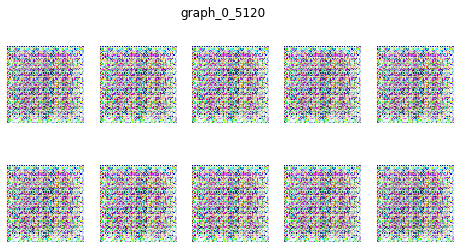

MODEL ID 1583521451.pt
step= 6144 , Generator loss=  tensor(2.9833, device='cuda:0') , Discriminator loss= tensor(0.3068, device='cuda:0')  (real= tensor(0.1884, device='cuda:0') ,fake= tensor(0.4251, device='cuda:0') )
step= 7168 , Generator loss=  tensor(2.5041, device='cuda:0') , Discriminator loss= tensor(0.5003, device='cuda:0')  (real= tensor(0.3503, device='cuda:0') ,fake= tensor(0.6503, device='cuda:0') )
step= 8192 , Generator loss=  tensor(4.5323, device='cuda:0') , Discriminator loss= tensor(0.6269, device='cuda:0')  (real= tensor(1.1843, device='cuda:0') ,fake= tensor(0.0695, device='cuda:0') )
step= 9216 , Generator loss=  tensor(1.4287, device='cuda:0') , Discriminator loss= tensor(0.6007, device='cuda:0')  (real= tensor(0.3159, device='cuda:0') ,fake= tensor(0.8855, device='cuda:0') )
step= 10240 , Generator loss=  tensor(1.3418, device='cuda:0') , Discriminator loss= tensor(0.5907, device='cuda:0')  (real= tensor(0.2175, device='cuda:0') ,fake= tensor(0.9638, device='cu

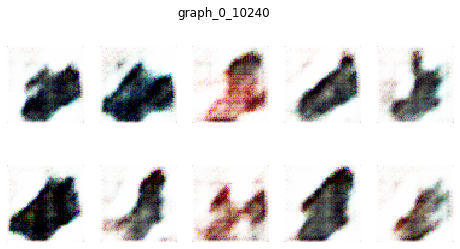

MODEL ID 1583521458.pt
step= 11264 , Generator loss=  tensor(2.6640, device='cuda:0') , Discriminator loss= tensor(0.4080, device='cuda:0')  (real= tensor(0.5527, device='cuda:0') ,fake= tensor(0.2633, device='cuda:0') )
step= 12288 , Generator loss=  tensor(2.4605, device='cuda:0') , Discriminator loss= tensor(0.3645, device='cuda:0')  (real= tensor(0.3906, device='cuda:0') ,fake= tensor(0.3383, device='cuda:0') )
step= 13312 , Generator loss=  tensor(1.6975, device='cuda:0') , Discriminator loss= tensor(0.5137, device='cuda:0')  (real= tensor(0.4110, device='cuda:0') ,fake= tensor(0.6164, device='cuda:0') )
step= 14336 , Generator loss=  tensor(1.3817, device='cuda:0') , Discriminator loss= tensor(0.4777, device='cuda:0')  (real= tensor(0.1797, device='cuda:0') ,fake= tensor(0.7757, device='cuda:0') )
step= 15360 , Generator loss=  tensor(2.5374, device='cuda:0') , Discriminator loss= tensor(0.5350, device='cuda:0')  (real= tensor(0.8040, device='cuda:0') ,fake= tensor(0.2659, device

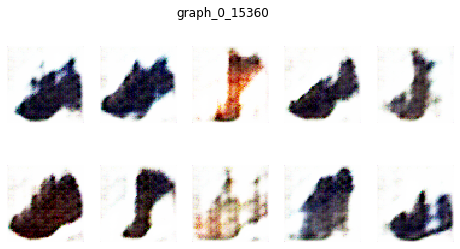

MODEL ID 1583521464.pt
step= 16384 , Generator loss=  tensor(0.8062, device='cuda:0') , Discriminator loss= tensor(0.7364, device='cuda:0')  (real= tensor(0.1457, device='cuda:0') ,fake= tensor(1.3270, device='cuda:0') )
step= 17408 , Generator loss=  tensor(2.3473, device='cuda:0') , Discriminator loss= tensor(0.5073, device='cuda:0')  (real= tensor(0.6915, device='cuda:0') ,fake= tensor(0.3230, device='cuda:0') )
step= 18432 , Generator loss=  tensor(2.2296, device='cuda:0') , Discriminator loss= tensor(0.4798, device='cuda:0')  (real= tensor(0.5000, device='cuda:0') ,fake= tensor(0.4596, device='cuda:0') )
step= 19456 , Generator loss=  tensor(1.0676, device='cuda:0') , Discriminator loss= tensor(0.6151, device='cuda:0')  (real= tensor(0.2279, device='cuda:0') ,fake= tensor(1.0023, device='cuda:0') )
step= 20480 , Generator loss=  tensor(1.6984, device='cuda:0') , Discriminator loss= tensor(0.5693, device='cuda:0')  (real= tensor(0.3993, device='cuda:0') ,fake= tensor(0.7394, device

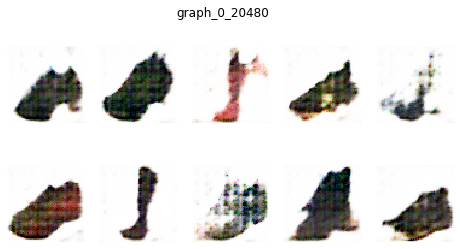

MODEL ID 1583521471.pt
step= 21504 , Generator loss=  tensor(1.9837, device='cuda:0') , Discriminator loss= tensor(0.5257, device='cuda:0')  (real= tensor(0.5156, device='cuda:0') ,fake= tensor(0.5359, device='cuda:0') )
step= 22528 , Generator loss=  tensor(1.2124, device='cuda:0') , Discriminator loss= tensor(0.5355, device='cuda:0')  (real= tensor(0.1894, device='cuda:0') ,fake= tensor(0.8816, device='cuda:0') )
step= 23552 , Generator loss=  tensor(1.6008, device='cuda:0') , Discriminator loss= tensor(0.5341, device='cuda:0')  (real= tensor(0.5007, device='cuda:0') ,fake= tensor(0.5675, device='cuda:0') )
step= 24576 , Generator loss=  tensor(2.4077, device='cuda:0') , Discriminator loss= tensor(0.4509, device='cuda:0')  (real= tensor(0.5834, device='cuda:0') ,fake= tensor(0.3183, device='cuda:0') )
step= 25600 , Generator loss=  tensor(2.4504, device='cuda:0') , Discriminator loss= tensor(0.4720, device='cuda:0')  (real= tensor(0.6084, device='cuda:0') ,fake= tensor(0.3355, device

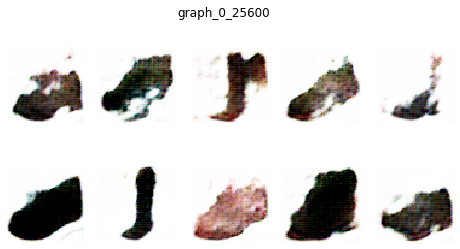

MODEL ID 1583521478.pt
step= 26624 , Generator loss=  tensor(1.3812, device='cuda:0') , Discriminator loss= tensor(0.5478, device='cuda:0')  (real= tensor(0.2646, device='cuda:0') ,fake= tensor(0.8310, device='cuda:0') )
step= 27648 , Generator loss=  tensor(1.0326, device='cuda:0') , Discriminator loss= tensor(0.6114, device='cuda:0')  (real= tensor(0.3394, device='cuda:0') ,fake= tensor(0.8835, device='cuda:0') )
step= 28672 , Generator loss=  tensor(2.7486, device='cuda:0') , Discriminator loss= tensor(0.5596, device='cuda:0')  (real= tensor(0.8113, device='cuda:0') ,fake= tensor(0.3078, device='cuda:0') )
step= 29696 , Generator loss=  tensor(2.0847, device='cuda:0') , Discriminator loss= tensor(0.5803, device='cuda:0')  (real= tensor(0.7537, device='cuda:0') ,fake= tensor(0.4069, device='cuda:0') )
step= 30720 , Generator loss=  tensor(2.2862, device='cuda:0') , Discriminator loss= tensor(0.4931, device='cuda:0')  (real= tensor(0.6392, device='cuda:0') ,fake= tensor(0.3469, device

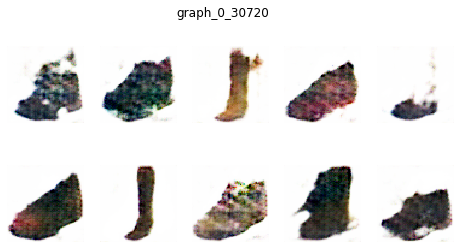

MODEL ID 1583521484.pt
step= 31744 , Generator loss=  tensor(2.0060, device='cuda:0') , Discriminator loss= tensor(0.6523, device='cuda:0')  (real= tensor(0.8488, device='cuda:0') ,fake= tensor(0.4558, device='cuda:0') )
step= 32768 , Generator loss=  tensor(1.8837, device='cuda:0') , Discriminator loss= tensor(0.5246, device='cuda:0')  (real= tensor(0.6928, device='cuda:0') ,fake= tensor(0.3565, device='cuda:0') )
step= 33792 , Generator loss=  tensor(1.6933, device='cuda:0') , Discriminator loss= tensor(0.5466, device='cuda:0')  (real= tensor(0.3573, device='cuda:0') ,fake= tensor(0.7359, device='cuda:0') )
step= 34816 , Generator loss=  tensor(2.4241, device='cuda:0') , Discriminator loss= tensor(0.5393, device='cuda:0')  (real= tensor(0.7974, device='cuda:0') ,fake= tensor(0.2812, device='cuda:0') )
step= 35840 , Generator loss=  tensor(0.8399, device='cuda:0') , Discriminator loss= tensor(0.7050, device='cuda:0')  (real= tensor(0.2283, device='cuda:0') ,fake= tensor(1.1817, device

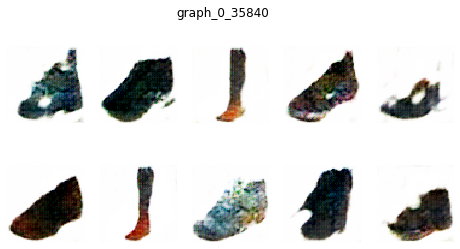

MODEL ID 1583521491.pt
step= 36864 , Generator loss=  tensor(2.3138, device='cuda:0') , Discriminator loss= tensor(0.5234, device='cuda:0')  (real= tensor(0.7137, device='cuda:0') ,fake= tensor(0.3331, device='cuda:0') )
step= 37888 , Generator loss=  tensor(2.3981, device='cuda:0') , Discriminator loss= tensor(0.5425, device='cuda:0')  (real= tensor(0.7385, device='cuda:0') ,fake= tensor(0.3464, device='cuda:0') )
step= 38912 , Generator loss=  tensor(1.9434, device='cuda:0') , Discriminator loss= tensor(0.4566, device='cuda:0')  (real= tensor(0.5381, device='cuda:0') ,fake= tensor(0.3750, device='cuda:0') )
step= 39936 , Generator loss=  tensor(1.0324, device='cuda:0') , Discriminator loss= tensor(0.6213, device='cuda:0')  (real= tensor(0.2763, device='cuda:0') ,fake= tensor(0.9662, device='cuda:0') )
step= 40960 , Generator loss=  tensor(1.3260, device='cuda:0') , Discriminator loss= tensor(0.5840, device='cuda:0')  (real= tensor(0.4335, device='cuda:0') ,fake= tensor(0.7345, device

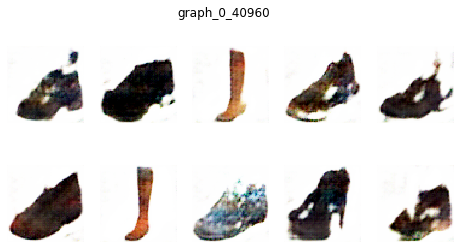

MODEL ID 1583521497.pt
step= 41984 , Generator loss=  tensor(1.7869, device='cuda:0') , Discriminator loss= tensor(0.6079, device='cuda:0')  (real= tensor(0.7695, device='cuda:0') ,fake= tensor(0.4463, device='cuda:0') )
step= 43008 , Generator loss=  tensor(1.6810, device='cuda:0') , Discriminator loss= tensor(0.6404, device='cuda:0')  (real= tensor(0.7087, device='cuda:0') ,fake= tensor(0.5721, device='cuda:0') )
step= 44032 , Generator loss=  tensor(2.1034, device='cuda:0') , Discriminator loss= tensor(0.5740, device='cuda:0')  (real= tensor(0.6154, device='cuda:0') ,fake= tensor(0.5327, device='cuda:0') )
step= 45056 , Generator loss=  tensor(1.5749, device='cuda:0') , Discriminator loss= tensor(0.6370, device='cuda:0')  (real= tensor(0.5241, device='cuda:0') ,fake= tensor(0.7500, device='cuda:0') )
step= 46080 , Generator loss=  tensor(1.6025, device='cuda:0') , Discriminator loss= tensor(0.6811, device='cuda:0')  (real= tensor(0.3307, device='cuda:0') ,fake= tensor(1.0316, device

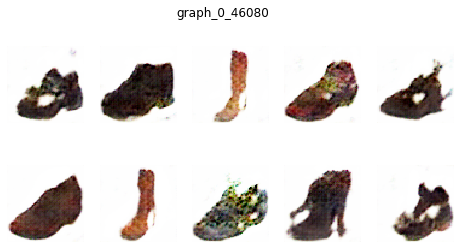

MODEL ID 1583521504.pt
step= 47104 , Generator loss=  tensor(1.9219, device='cuda:0') , Discriminator loss= tensor(0.4431, device='cuda:0')  (real= tensor(0.4917, device='cuda:0') ,fake= tensor(0.3945, device='cuda:0') )
step= 48128 , Generator loss=  tensor(1.6247, device='cuda:0') , Discriminator loss= tensor(0.5471, device='cuda:0')  (real= tensor(0.5551, device='cuda:0') ,fake= tensor(0.5390, device='cuda:0') )
step= 49152 , Generator loss=  tensor(1.8056, device='cuda:0') , Discriminator loss= tensor(0.5160, device='cuda:0')  (real= tensor(0.5223, device='cuda:0') ,fake= tensor(0.5097, device='cuda:0') )


In [ ]:
#TRAIN LOOP FUNCTION
writer = SummaryWriter(log_dir="/content/drive//My Drive/Colab Notebooks/GANs/Logs")

def trainGAN(G, D, G_optimizer, D_optimizer, dataloader, epochs):
  #Loss functions for generator and discriminator
  gLossFun = nn.BCELoss().to(device)
  dLossFun = nn.BCELoss().to(device)
  n = dataloader.batch_size
  step = 0
  latent_vec = z_vector(n)
  for i in range(0, epochs):
    for j, (X, y) in enumerate(dataloader):
      step = step + 1
      X = X.to(device)
      y = y.to(device)
      z = z_vector(X.shape[0]).to(device)

      #Train generator
      G.zero_grad()
      GLoss = GeneratorLoss(G, D, z, gLossFun)
      GLoss.backward()
      G_optimizer.step()

      #Train discriminator
      D.zero_grad()
      fakeLoss, realLoss, DLoss = DiscriminatorLoss(G, D, z, X, dLossFun)
      DLoss.backward()
      D_optimizer.step()

      #print stats
      if(step%32 == 0) :
        print('step=',step*n,', Generator loss= ',GLoss.data,', Discriminator loss=',DLoss.data,' (real=',realLoss.data,',fake=',fakeLoss.data,')')
        writer.add_scalar("G Loss", GLoss, step)
        writer.add_scalar("D Loss", DLoss, step)
        writer.add_scalar("D Loss/real",realLoss, step)
        writer.add_scalar("D Loss/fake", fakeLoss, step)
      #print images
      if(step%160 == 0) :
          generate_images(G(latent_vec), 2, 5, 'graph_'+str(i)+'_'+str(step*n))
          torch.save(G.state_dict(), "/content/drive//My Drive/Colab Notebooks/GANs/Models/generator-%d.pt"%(int(time.time())))
          torch.save(D.state_dict(), "/content/drive//My Drive/Colab Notebooks/GANs/Models/discriminator-%d.pt"%(int(time.time())))
          print("MODEL ID %d.pt"%(int(time.time())))

epochs = 56
#GENERATOR, DISCRIMINATOR, OPTIMIZERS
batch_size = 32
n_channel = 3
n_features = 100
trainLoader = DataLoader(images,batch_size=batch_size,shuffle=True,num_workers=2)
generator = Generator(n_features).to(device)
discriminator = Discriminator(n_channel).to(device)
D_optimizer = optim.Adam(discriminator.parameters(),0.0001, betas=(0.5, 0.999))
G_optimizer = optim.Adam(generator.parameters(),0.0003, betas=(0.5, 0.999))
trainGAN(generator, discriminator, G_optimizer, D_optimizer, trainLoader, epochs)
torch.save(generator.state_dict(), "/content/drive//My Drive/Colab Notebooks/HW3/GANs/Models/final_generator.pt")
torch.save(discriminator.state_dict(), "/content/drive//My Drive/Colab Notebooks/HW3/GANs/Models/final_discriminator.pt")

In [ ]:
#RELOAD FROM DRIVE
model_location = '/content/drive//My Drive/Colab Notebooks/GANs/Models/'
generator_file = 'final_generator.pt'
discriminator_file = 'final_discriminator.pt'
batch_size = 32
n_channel = 3
n_features = 100
generator = Generator(n_features)
generator.load_state_dict(torch.load(model_location+generator_file))
generator = generator.to(device)
discriminator = Discriminator(n_channel)
discriminator.load_state_dict(torch.load(model_location+discriminator_file))
discriminator = discriminator.to(device)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


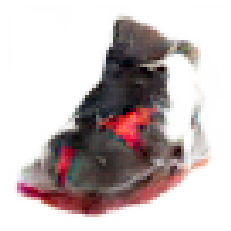

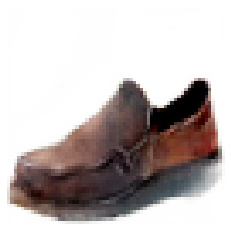

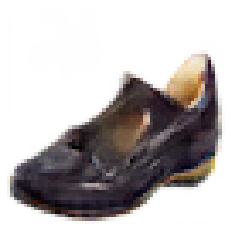

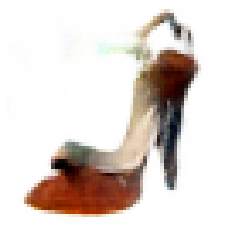

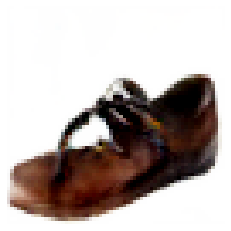

...

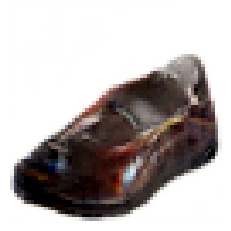

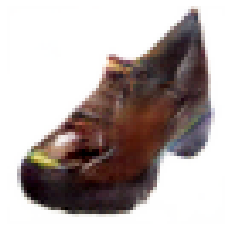

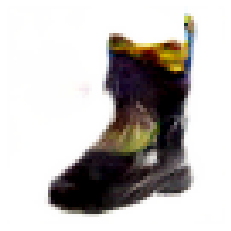

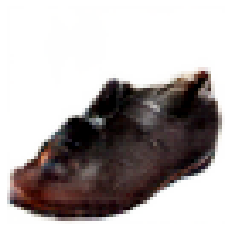

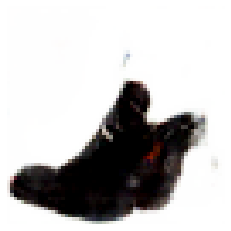

In [ ]:
#VISUALIZE
from IPython.display import Image
to_img = torchvision.transforms.ToPILImage()
for i in range(0,10):
  for j in range(0,10):
    z_ = z_vector(1)
    data = generator(z_)[0]
    img = data.cpu().detach()
    img = torch.clamp(img, min=0, max=255)
    img = img.numpy()
    fig,axs = plt.subplots()
    axs.imshow(img.transpose((1,2,0)))
    axs.axis('off')

##Least Square GAN:


In [ ]:
%tensorboard --logdir="/content/drive//My Drive/Colab Notebooks/LSGANs/Logs"

In [ ]:
#GENERATOR AND DISCRIMINATOR CLASSES
class LSGenerator(nn.Module):
  def __init__(self, in_size):
    super(LSGenerator, self).__init__()
    self.deconv1 = nn.ConvTranspose2d(in_size, 512, 4, 1, 0) #Size 512x1x1
    self.deconv2 = nn.ConvTranspose2d(512, 256, 4, 2, 1) #Size 256x2x2
    self.deconv3 = nn.ConvTranspose2d(256, 128, 4, 2, 1) #Size 128x4x4
    self.deconv4 = nn.ConvTranspose2d(128, 64, 4, 2, 1) #Size 64x16x16
    self.deconv5 = nn.ConvTranspose2d(64, 3, 4, 2, 1) #Size 3x64x64
    self.bn1 = nn.BatchNorm2d(512)
    self.bn2 = nn.BatchNorm2d(256)
    self.bn3 = nn.BatchNorm2d(128)
    self.bn4 = nn.BatchNorm2d(64)
    self.relu = nn.LeakyReLU(0.2)
    self.tanh = nn.Tanh()

  def forward(self, x):
    x = self.relu(self.bn1(self.deconv1(x)))
    x = self.relu(self.bn2(self.deconv2(x)))
    x = self.relu(self.bn3(self.deconv3(x)))
    x = self.relu(self.bn4(self.deconv4(x)))
    x = self.deconv5(x)
    out = self.tanh(x)
    return out

class LSDiscriminator(nn.Module):
  def __init__(self, in_size):
    super(LSDiscriminator, self).__init__()
    self.conv1 = nn.Conv2d(in_size, 64, 4, 2, 1)
    self.conv2 = nn.Conv2d(64, 128, 4, 2, 1)
    self.conv3 = nn.Conv2d(128, 256, 4, 2, 1)
    self.conv4 = nn.Conv2d(256, 512, 4, 2, 1)
    self.conv5 = nn.Conv2d(512, 1, 4, 1, 0)
    self.bn1 = nn.BatchNorm2d(64)
    self.bn2 = nn.BatchNorm2d(128)
    self.bn3 = nn.BatchNorm2d(256)
    self.bn4 = nn.BatchNorm2d(512)
    self.relu = nn.LeakyReLU(0.2)

  def forward(self, x):
    x = self.relu(self.bn1(self.conv1(x)))
    x = self.relu(self.bn2(self.conv2(x)))
    x = self.relu(self.bn3(self.conv3(x)))
    x = self.relu(self.bn4(self.conv4(x)))
    out = self.conv5(x)
    return out.view(-1)
    

def LSGeneratorLoss(G, D, z, loss):
  n = z.shape[0]
  image = G(z)
  predicted = D(image)
  ideal = torch.ones(n).to(device);
  genLoss = loss(predicted, ideal)
  return genLoss/2

def LSDiscriminatorLoss(G, D, Z, X, loss):
  n = X.shape[0]
  image = G(Z).detach()
  predictedG = D(image).view(-1)
  idealG = torch.zeros(n).to(device);
  predictedR = D(X)
  predictedR = predictedR.view(-1)
  idealR = torch.ones(n).to(device);
  fakeLoss = loss(predictedG, idealG)
  realLoss = loss(predictedR, idealR)
  totalLoss = (fakeLoss + realLoss)/(2)
  return fakeLoss, realLoss, totalLoss

**Q5b (5):**Plot the outputs for 10 intermediate stages of training and visulaize the generated outputs for those intermediate stages.

In [ ]:
#VISUALIZING AND TRAINING FUNCTIONS
def generate_LS_images(imgs, rows, cols, name= "lsgan", show= True):
  '''
  Displays the images in a rows * cols grid
  '''
  imgs= imgs[:rows*cols].cpu().detach().numpy()
  fig, ax= plt.subplots(rows, cols, figsize=(8,4))
  count= 0
  imgs = np.clip(imgs, a_min = 0, a_max = 255) 

  for row in range(rows):
    for col in range(cols):
      img= imgs[count]
      ax[row, col].imshow(np.transpose(img, (1, 2, 0)))
      ax[row, col].axis('off')
      count += 1
  fig.suptitle(name)
  fig.savefig("/content/drive//My Drive/Colab Notebooks/LSGANs/Images/%s.png"%(name))
  if(show): 
    plt.show()
  else: 
    plt.close()
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(log_dir="/content/drive//My Drive/Colab Notebooks/LSGANs/Logs")

def trainLSGAN(G, D, G_optimizer, D_optimizer, dataloader, epochs):
  gLossFun = nn.MSELoss().to(device)
  dLossFun = nn.MSELoss().to(device)
  n = dataloader.batch_size
  step = 0
  latent_vec = z_vector(n)
  for i in range(0, epochs):
    for j, (X, y) in enumerate(dataloader):
      step = step + 1
      X = X.to(device)
      y = y.to(device)
      z = z_vector(X.shape[0]).to(device)
      #Train generator
      G.zero_grad()
      GLoss = LSGeneratorLoss(G, D, z, gLossFun)
      GLoss.backward()
      G_optimizer.step()

      #Train discriminator
      D.zero_grad()
      fakeLoss, realLoss, DLoss = LSDiscriminatorLoss(G, D, z, X, dLossFun)
      DLoss.backward()
      D_optimizer.step()

      #print stats
      if(step%32 == 0) :
        print('step=',step*n,', Generator loss= ',GLoss.data,', Discriminator loss=',DLoss.data,' (real=',realLoss.data,',fake=',fakeLoss.data,')')
        writer.add_scalar("G Loss", GLoss, step)
        writer.add_scalar("D Loss", DLoss, step)
        writer.add_scalar("D Loss/real",realLoss, step)
        writer.add_scalar("D Loss/fake", fakeLoss, step)
      #print images
      if(step%160 == 0) :
          generate_LS_images(G(latent_vec), 2, 5, 'graph_'+str(i)+'_'+str(step*n))
          torch.save(G.state_dict(), "/content/drive//My Drive/Colab Notebooks/LSGANs/Models/generator-%d.pt"%(int(time.time())))
          torch.save(D.state_dict(), "/content/drive//My Drive/Colab Notebooks/LSGANs/Models/discriminator-%d.pt"%(int(time.time())))
          print("MODEL ID %d.pt"%(int(time.time())))



step= 1024 , Generator loss=  tensor(2.0259, device='cuda:0') , Discriminator loss= tensor(0.5093, device='cuda:0')  (real= tensor(0.8367, device='cuda:0') ,fake= tensor(0.1819, device='cuda:0') )
step= 2048 , Generator loss=  tensor(3.2284, device='cuda:0') , Discriminator loss= tensor(0.4503, device='cuda:0')  (real= tensor(0.0856, device='cuda:0') ,fake= tensor(0.8150, device='cuda:0') )
step= 3072 , Generator loss=  tensor(2.2619, device='cuda:0') , Discriminator loss= tensor(0.3126, device='cuda:0')  (real= tensor(0.2731, device='cuda:0') ,fake= tensor(0.3522, device='cuda:0') )
step= 4096 , Generator loss=  tensor(0.0553, device='cuda:0') , Discriminator loss= tensor(0.3622, device='cuda:0')  (real= tensor(0.0630, device='cuda:0') ,fake= tensor(0.6614, device='cuda:0') )
step= 5120 , Generator loss=  tensor(0.1242, device='cuda:0') , Discriminator loss= tensor(0.4262, device='cuda:0')  (real= tensor(0.0715, device='cuda:0') ,fake= tensor(0.7808, device='cuda:0') )


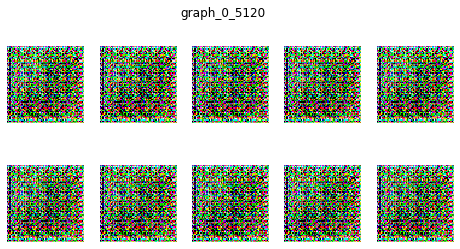

MODEL ID 1583520628.pt
step= 6144 , Generator loss=  tensor(0.0226, device='cuda:0') , Discriminator loss= tensor(0.8255, device='cuda:0')  (real= tensor(0.2060, device='cuda:0') ,fake= tensor(1.4450, device='cuda:0') )
step= 7168 , Generator loss=  tensor(2.1864, device='cuda:0') , Discriminator loss= tensor(0.2523, device='cuda:0')  (real= tensor(0.3725, device='cuda:0') ,fake= tensor(0.1322, device='cuda:0') )
step= 8192 , Generator loss=  tensor(0.4589, device='cuda:0') , Discriminator loss= tensor(0.1134, device='cuda:0')  (real= tensor(0.0129, device='cuda:0') ,fake= tensor(0.2139, device='cuda:0') )
step= 9216 , Generator loss=  tensor(0.0620, device='cuda:0') , Discriminator loss= tensor(0.3851, device='cuda:0')  (real= tensor(0.0930, device='cuda:0') ,fake= tensor(0.6772, device='cuda:0') )
step= 10240 , Generator loss=  tensor(0.4315, device='cuda:0') , Discriminator loss= tensor(0.0605, device='cuda:0')  (real= tensor(0.0172, device='cuda:0') ,fake= tensor(0.1038, device='cu

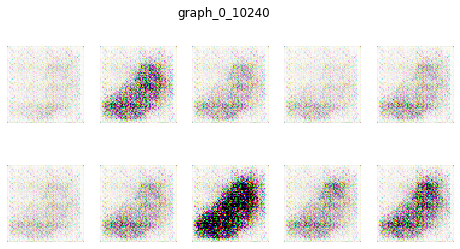

MODEL ID 1583520635.pt
step= 11264 , Generator loss=  tensor(0.3366, device='cuda:0') , Discriminator loss= tensor(0.1094, device='cuda:0')  (real= tensor(0.0411, device='cuda:0') ,fake= tensor(0.1777, device='cuda:0') )
step= 12288 , Generator loss=  tensor(0.3241, device='cuda:0') , Discriminator loss= tensor(0.1096, device='cuda:0')  (real= tensor(0.0283, device='cuda:0') ,fake= tensor(0.1909, device='cuda:0') )
step= 13312 , Generator loss=  tensor(0.4608, device='cuda:0') , Discriminator loss= tensor(0.1151, device='cuda:0')  (real= tensor(0.1070, device='cuda:0') ,fake= tensor(0.1231, device='cuda:0') )
step= 14336 , Generator loss=  tensor(0.3217, device='cuda:0') , Discriminator loss= tensor(0.1285, device='cuda:0')  (real= tensor(0.0324, device='cuda:0') ,fake= tensor(0.2246, device='cuda:0') )
step= 15360 , Generator loss=  tensor(0.1965, device='cuda:0') , Discriminator loss= tensor(0.1759, device='cuda:0')  (real= tensor(0.0261, device='cuda:0') ,fake= tensor(0.3257, device

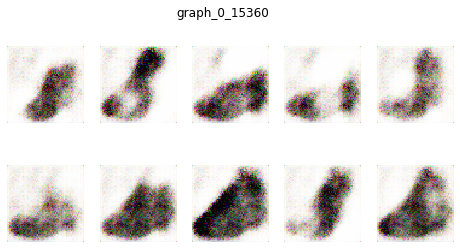

MODEL ID 1583520642.pt
step= 16384 , Generator loss=  tensor(0.2193, device='cuda:0') , Discriminator loss= tensor(0.1635, device='cuda:0')  (real= tensor(0.0596, device='cuda:0') ,fake= tensor(0.2675, device='cuda:0') )
step= 17408 , Generator loss=  tensor(0.9497, device='cuda:0') , Discriminator loss= tensor(0.3308, device='cuda:0')  (real= tensor(0.6353, device='cuda:0') ,fake= tensor(0.0263, device='cuda:0') )
step= 18432 , Generator loss=  tensor(0.3759, device='cuda:0') , Discriminator loss= tensor(0.0988, device='cuda:0')  (real= tensor(0.0887, device='cuda:0') ,fake= tensor(0.1089, device='cuda:0') )
step= 19456 , Generator loss=  tensor(0.6501, device='cuda:0') , Discriminator loss= tensor(0.0656, device='cuda:0')  (real= tensor(0.1027, device='cuda:0') ,fake= tensor(0.0285, device='cuda:0') )
step= 20480 , Generator loss=  tensor(0.3032, device='cuda:0') , Discriminator loss= tensor(0.1730, device='cuda:0')  (real= tensor(0.0437, device='cuda:0') ,fake= tensor(0.3024, device

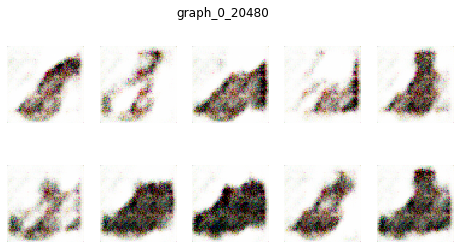

MODEL ID 1583520648.pt
step= 21504 , Generator loss=  tensor(0.1687, device='cuda:0') , Discriminator loss= tensor(0.1825, device='cuda:0')  (real= tensor(0.0159, device='cuda:0') ,fake= tensor(0.3491, device='cuda:0') )
step= 22528 , Generator loss=  tensor(0.6264, device='cuda:0') , Discriminator loss= tensor(0.0844, device='cuda:0')  (real= tensor(0.1504, device='cuda:0') ,fake= tensor(0.0184, device='cuda:0') )
step= 23552 , Generator loss=  tensor(0.4878, device='cuda:0') , Discriminator loss= tensor(0.1242, device='cuda:0')  (real= tensor(0.1819, device='cuda:0') ,fake= tensor(0.0665, device='cuda:0') )
step= 24576 , Generator loss=  tensor(0.2016, device='cuda:0') , Discriminator loss= tensor(0.1562, device='cuda:0')  (real= tensor(0.0213, device='cuda:0') ,fake= tensor(0.2912, device='cuda:0') )
step= 25600 , Generator loss=  tensor(0.4435, device='cuda:0') , Discriminator loss= tensor(0.0875, device='cuda:0')  (real= tensor(0.0537, device='cuda:0') ,fake= tensor(0.1213, device

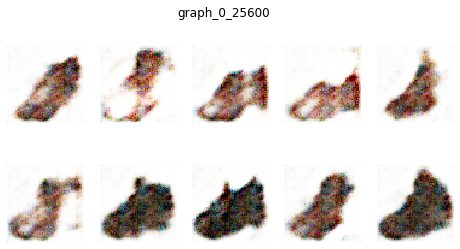

MODEL ID 1583520655.pt
step= 26624 , Generator loss=  tensor(0.9221, device='cuda:0') , Discriminator loss= tensor(0.1877, device='cuda:0')  (real= tensor(0.3081, device='cuda:0') ,fake= tensor(0.0673, device='cuda:0') )
step= 27648 , Generator loss=  tensor(0.5665, device='cuda:0') , Discriminator loss= tensor(0.1079, device='cuda:0')  (real= tensor(0.1541, device='cuda:0') ,fake= tensor(0.0617, device='cuda:0') )
step= 28672 , Generator loss=  tensor(0.1227, device='cuda:0') , Discriminator loss= tensor(0.2697, device='cuda:0')  (real= tensor(0.0363, device='cuda:0') ,fake= tensor(0.5030, device='cuda:0') )
step= 29696 , Generator loss=  tensor(0.2082, device='cuda:0') , Discriminator loss= tensor(0.2006, device='cuda:0')  (real= tensor(0.0982, device='cuda:0') ,fake= tensor(0.3029, device='cuda:0') )
step= 30720 , Generator loss=  tensor(0.3497, device='cuda:0') , Discriminator loss= tensor(0.1962, device='cuda:0')  (real= tensor(0.2064, device='cuda:0') ,fake= tensor(0.1861, device

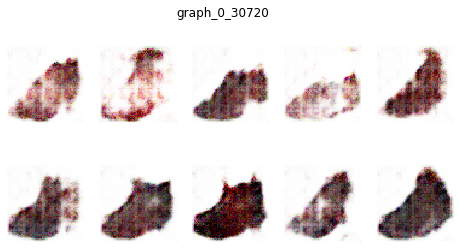

MODEL ID 1583520661.pt
step= 31744 , Generator loss=  tensor(0.4405, device='cuda:0') , Discriminator loss= tensor(0.1072, device='cuda:0')  (real= tensor(0.0823, device='cuda:0') ,fake= tensor(0.1320, device='cuda:0') )
step= 32768 , Generator loss=  tensor(0.1897, device='cuda:0') , Discriminator loss= tensor(0.2308, device='cuda:0')  (real= tensor(0.0177, device='cuda:0') ,fake= tensor(0.4438, device='cuda:0') )
step= 33792 , Generator loss=  tensor(0.4560, device='cuda:0') , Discriminator loss= tensor(0.1731, device='cuda:0')  (real= tensor(0.2683, device='cuda:0') ,fake= tensor(0.0780, device='cuda:0') )
step= 34816 , Generator loss=  tensor(0.6755, device='cuda:0') , Discriminator loss= tensor(0.1156, device='cuda:0')  (real= tensor(0.2042, device='cuda:0') ,fake= tensor(0.0269, device='cuda:0') )
step= 35840 , Generator loss=  tensor(0.1641, device='cuda:0') , Discriminator loss= tensor(0.1811, device='cuda:0')  (real= tensor(0.0202, device='cuda:0') ,fake= tensor(0.3419, device

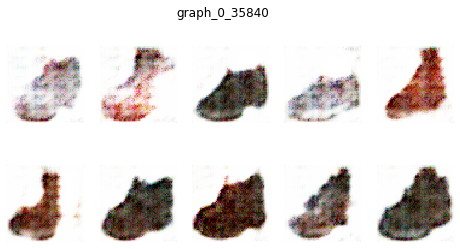

MODEL ID 1583520668.pt
step= 36864 , Generator loss=  tensor(0.0762, device='cuda:0') , Discriminator loss= tensor(0.2963, device='cuda:0')  (real= tensor(0.0380, device='cuda:0') ,fake= tensor(0.5545, device='cuda:0') )
step= 37888 , Generator loss=  tensor(0.1589, device='cuda:0') , Discriminator loss= tensor(0.2335, device='cuda:0')  (real= tensor(0.0386, device='cuda:0') ,fake= tensor(0.4283, device='cuda:0') )
step= 38912 , Generator loss=  tensor(0.3310, device='cuda:0') , Discriminator loss= tensor(0.1560, device='cuda:0')  (real= tensor(0.1004, device='cuda:0') ,fake= tensor(0.2116, device='cuda:0') )
step= 39936 , Generator loss=  tensor(0.5263, device='cuda:0') , Discriminator loss= tensor(0.1270, device='cuda:0')  (real= tensor(0.1800, device='cuda:0') ,fake= tensor(0.0740, device='cuda:0') )
step= 40960 , Generator loss=  tensor(0.5754, device='cuda:0') , Discriminator loss= tensor(0.2457, device='cuda:0')  (real= tensor(0.4502, device='cuda:0') ,fake= tensor(0.0412, device

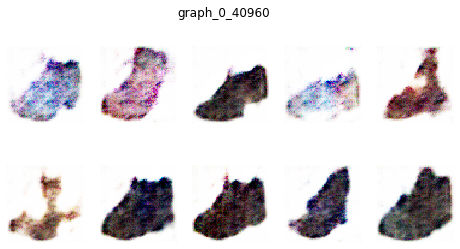

MODEL ID 1583520675.pt
step= 41984 , Generator loss=  tensor(0.6731, device='cuda:0') , Discriminator loss= tensor(0.1938, device='cuda:0')  (real= tensor(0.3628, device='cuda:0') ,fake= tensor(0.0248, device='cuda:0') )
step= 43008 , Generator loss=  tensor(0.2891, device='cuda:0') , Discriminator loss= tensor(0.1932, device='cuda:0')  (real= tensor(0.1565, device='cuda:0') ,fake= tensor(0.2299, device='cuda:0') )
step= 44032 , Generator loss=  tensor(0.6368, device='cuda:0') , Discriminator loss= tensor(0.2701, device='cuda:0')  (real= tensor(0.5164, device='cuda:0') ,fake= tensor(0.0238, device='cuda:0') )
step= 45056 , Generator loss=  tensor(0.3985, device='cuda:0') , Discriminator loss= tensor(0.1293, device='cuda:0')  (real= tensor(0.1324, device='cuda:0') ,fake= tensor(0.1262, device='cuda:0') )
step= 46080 , Generator loss=  tensor(0.6203, device='cuda:0') , Discriminator loss= tensor(0.2358, device='cuda:0')  (real= tensor(0.4477, device='cuda:0') ,fake= tensor(0.0240, device

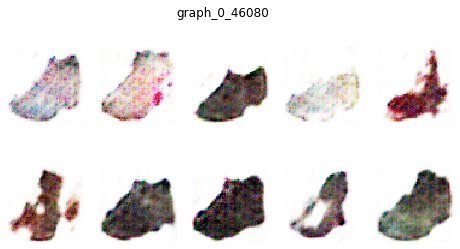

MODEL ID 1583520681.pt
step= 47104 , Generator loss=  tensor(0.5124, device='cuda:0') , Discriminator loss= tensor(0.1747, device='cuda:0')  (real= tensor(0.2704, device='cuda:0') ,fake= tensor(0.0791, device='cuda:0') )
step= 48128 , Generator loss=  tensor(0.3948, device='cuda:0') , Discriminator loss= tensor(0.1315, device='cuda:0')  (real= tensor(0.1515, device='cuda:0') ,fake= tensor(0.1115, device='cuda:0') )
step= 49152 , Generator loss=  tensor(0.3545, device='cuda:0') , Discriminator loss= tensor(0.1108, device='cuda:0')  (real= tensor(0.0723, device='cuda:0') ,fake= tensor(0.1494, device='cuda:0') )


In [ ]:
#INITIALIZE AND TRAIN LSGAN
#DO NOT RUN AGAIN
batch_size = 32
n_channel = 3
n_features = 100
epochs = 50
trainLoader = DataLoader(images,batch_size=batch_size,shuffle=True,num_workers=2)
ls_generator = LSGenerator(n_features).to(device)
ls_discriminator = LSDiscriminator(n_channel).to(device)
ls_D_optimizer = optim.Adam(ls_discriminator.parameters(),0.0001, betas=(0.5, 0.999))
ls_G_optimizer = optim.Adam(ls_generator.parameters(),0.0003, betas=(0.5, 0.999))
trainLSGAN(ls_generator, ls_discriminator, ls_G_optimizer, ls_D_optimizer, trainLoader, epochs)
torch.save(ls_generator.state_dict(), "/content/drive//My Drive/Colab Notebooks/LSGANs/Models/final_generator.pt")
torch.save(ls_discriminator.state_dict(), "/content/drive//My Drive/Colab Notebooks/LSGANs/Models/final_discriminator.pt")

**Q5c (5):**Generate 10 samples using the trained model

In [ ]:
#Reload from drive
model_location = '/content/drive//My Drive/Colab Notebooks/LSGANs/Models/'
generator_file = 'final_generator.pt'
discriminator_file = 'final_discriminator.pt'
batch_size = 32
n_channel = 3
n_features = 100
ls_generator = LSGenerator(n_features)
ls_generator.load_state_dict(torch.load(model_location + generator_file))
ls_generator = ls_generator.to(device)
ls_discriminator = LSDiscriminator(n_channel)
ls_discriminator.load_state_dict(torch.load(model_location + discriminator_file))
ls_discriminator = ls_discriminator.to(device)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


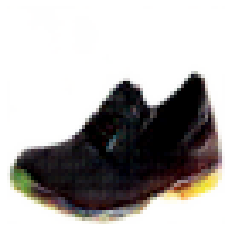

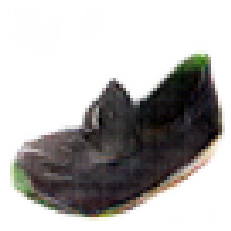

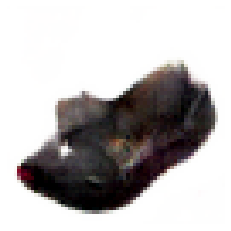

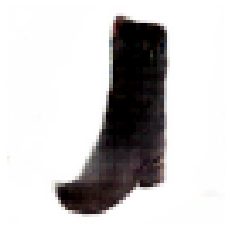

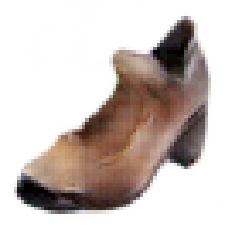

...

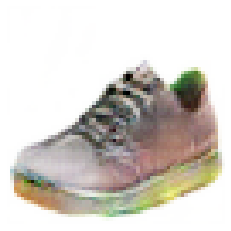

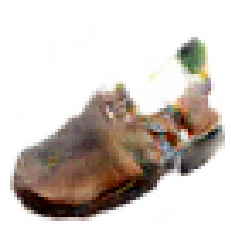

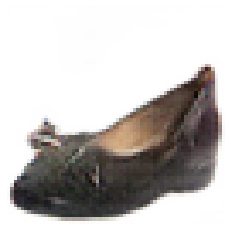

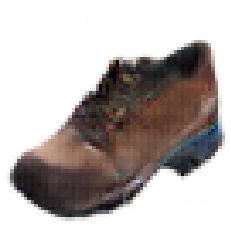

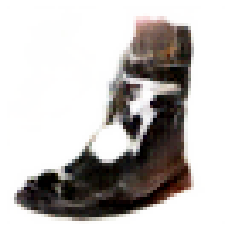

In [ ]:
from IPython.display import Image
to_img = torchvision.transforms.ToPILImage()
for i in range(0,10):
  for j in range(0,10):
    z_ = z_vector(1)
    data = ls_generator(z_)[0]
    img = data.cpu().detach()
    img = torch.clamp(img, min=0, max=255)
    dimg = to_img(img)
    dimg.save('/content/drive/My Drive/LSGANs/recreated_%s_%s.png'%(str(i),str(j)))
    img = img.numpy()
    fig,axs = plt.subplots()
    axs.imshow(img.transpose((1,2,0)))
    axs.axis('off')